# Time Series Project Energy Forecasting


In [ ]:
!pip uninstall matplotlib

Found existing installation: matplotlib 3.2.2
Uninstalling matplotlib-3.2.2:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.2.2-py3.7-nspkg.pth
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.2.2.dist-info/*
    /usr/local/lib/python3.7/dist-packages/matplotlib.libs/libpng16-cfdb1654.so.16.21.0
    /usr/local/lib/python3.7/dist-packages/matplotlib.libs/libz-a147dcb0.so.1.2.3
    /usr/local/lib/python3.7/dist-packages/matplotlib/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid1/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axisartist/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/mplot3d/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/tests/*
    /usr/local/lib/python3.7/dist-packages/pylab.py
Proceed (y/n)? y
  Successfully uninstalled matplotlib-3.2.2


In [ ]:
%%capture
!pip install optuna
!pip3 install sktime
!pip3 install tbats
!pip3 install pmdarima
#!pip3 install neuralforecast
#!pip install -U numba
!pip3 install statsforecast
#!pip3 install mlforecast
#!pip3 install git+https://github.com/Nixtla/neuralforecast.git@main
!pip3 install popmon
!pip3 install tslearn
!pip3 install adtk
!pip install kneed
!pip install darts
#!pip install pytorch-forecasting
!pip install causal-ccm
!pip install ESRNN
!pip install matplotlib
!pip install scikeras[tensorflow]
!pip install causal-ccm
#!pip install sktime-dl
#!pip install statsforecast[ray]
#!pip install keras-beats

## See If CUDA is available for GPU

In [ ]:
import torch as t
t.cuda.is_available() 

In [ ]:
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import pytorch_lightning as pl
from tqdm import tqdm
import warnings
warnings.simplefilter("ignore", UserWarning)

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


## Get The Datasets and Clean it

In [ ]:
# !unzip '/content/drive/MyDrive/Datasets/TimeSeries/household_power_consumption.zip'
# EnergyData=pd.read_table('household_power_consumption.txt', delimiter = ';')
# EnergyData['DateTime']=EnergyData['Date']+' '+EnergyData['Time']
# EnergyData['DateTime']=EnergyData['DateTime'].astype({'DateTime': 'datetime64[ns]'})
# first_column = EnergyData.pop('DateTime')
# EnergyData.insert(0, 'DateTime', first_column)
# EnergyData=EnergyData.drop(columns=['Date','Time'])
# EnergyData=EnergyData.replace('?',np.nan)
# for i in range(1,len(EnergyData.columns)):
#   EnergyData[EnergyData.columns[0+i]]=EnergyData[EnergyData.columns[0+i]].astype(float).interpolate(method='linear')
# EnergyDataClened=EnergyData
# EnergyDataClened.to_csv('/content/drive/MyDrive/Datasets/TimeSeries/EnergyDataClened.csv',index=False)

In [ ]:
EnergyDataClened=pd.read_csv('/content/drive/MyDrive/Datasets/TimeSeries/EnergyDataClened.csv')
EnergyDataClened['DateTime']=EnergyDataClened['DateTime'].astype({'DateTime': 'datetime64[ns]'})
FinalizedDataFrame = EnergyDataClened

## Data Report

### Data Report on Base Data

In [ ]:
import popmon

In [ ]:

#PopmonData=FinalizedDataFrame.resample('1H', label='right', closed = 'right', on='DateTime').sum().reset_index()
report = FinalizedDataFrame.pm_stability_report(time_axis=FinalizedDataFrame.columns[0], features=["DateTime:" + item for item in FinalizedDataFrame.columns[1::].tolist()])

100%|█████████████████████████████████████████████████████████████████| 7/7 [00:08<00:00,  1.24s/it]


In [ ]:
report

In [ ]:
report.to_file('/content/drive/MyDrive/Datasets/TimeSeries/EnergyReport.html')

### Data Report On Smoothed Data

In [ ]:
AggregatedData=FinalizedDataFrame.resample('1W', label='right', closed = 'right', on='DateTime').sum().reset_index()

In [ ]:
report2 = AggregatedData.pm_stability_report(time_axis=AggregatedData.columns[0], features=["DateTime:" + item for item in AggregatedData.columns[1::].tolist()])


100%|█████████████████████████████████████████████████████████████████| 7/7 [00:11<00:00,  1.58s/it]


In [ ]:
report2

In [ ]:
report2.to_file('/content/drive/MyDrive/Datasets/TimeSeries/EnergyReportAggregated.html')

As you can see we, when we smooth the data to a weekly format the data becomes a lot easier for a model to predic tand thus we will not have as much of an erratic dataset for our model. 

## Hypothesis Testing


### Understanding if there is nonlinearity in timeseries


#### Hypothesis Testing NonLinearity

In [ ]:
from statsmodels.tsa.stattools import bds
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss

##### Do the same test on the entire dataset
We use a stationarity ADF and KPSS test to see if the dataset is stationary, and if the dataset is stationary we will use a BDS test to see if there is nonlinearity.
The entire dataset fails the null hypothesis hence the alternative hypothesis passes and therefore there is nonlinearity in the timeseries.

In [ ]:
AggregatedData=FinalizedDataFrame.resample('1D', label='right', closed = 'right', on='DateTime').sum().reset_index()
for i in range(1,len(AggregatedData.columns)):
  AdfullStationary=adfuller(AggregatedData[AggregatedData.columns[0+i]])
  kpssStationary=kpss((AggregatedData[AggregatedData.columns[0+i]]), regression="c", nlags="auto")
  if kpssStationary[1] >0.05 or AdfullStationary[1] >0.05:#TimeSeries is nonstationary (Does not have unit root -- root means the time series is non-stationary)

    DifferencedData=AggregatedData[AggregatedData.columns[0+i]].diff(1).dropna()
    nonlinearityTest=bds(DifferencedData, max_dim=2, epsilon=None, distance=1.5)
    if nonlinearityTest[1]>0.05:
      print('NonStationary',AggregatedData.columns[0+i])
    else:#TimeSeries is stationary (Does Have Unit Root)
      nonlinearityTest=bds(AggregatedData[AggregatedData.columns[0+i]], max_dim=2, epsilon=None, distance=1.5)
      if nonlinearityTest[1]>0.05:
        print('Stationary',AggregatedData.columns[0+i])

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:2019: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warn_msg.format(direction="smaller"), InterpolationWarning
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:2019: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warn_msg.format(direction="smaller"), InterpolationWarning
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:2019: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warn_msg.format(direction="smaller"), InterpolationWarning
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:2019: InterpolationWarning

In [ ]:
AggregatedData

## Univariate Approach

In [ ]:
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
from sktime.performance_metrics.forecasting import mean_absolute_percentage_error,MeanSquaredError
from sktime.forecasting.base import ForecastingHorizon
from sktime.performance_metrics.forecasting import GeometricMeanRelativeSquaredError


import random

In [ ]:
%%capture
AggregatedData=FinalizedDataFrame.resample('1W', label='right', closed = 'right', on='DateTime').sum().reset_index()
BottomCausal=AggregatedData[['DateTime','Global_active_power']].copy()
BottomCausal['DateTime']=BottomCausal['DateTime'].dt.to_period()
y_train, y_test = temporal_train_test_split(BottomCausal.set_index('DateTime')[['Global_active_power']], test_size=30)
fh = ForecastingHorizon(y_test.index, is_relative=False)


#### BenchMark (BATS Model)

BATs model performs well on timeseries with multiple seasonalities

In [ ]:
from sktime.forecasting.bats import BATS


0.1857571622505861
2005.594312005336


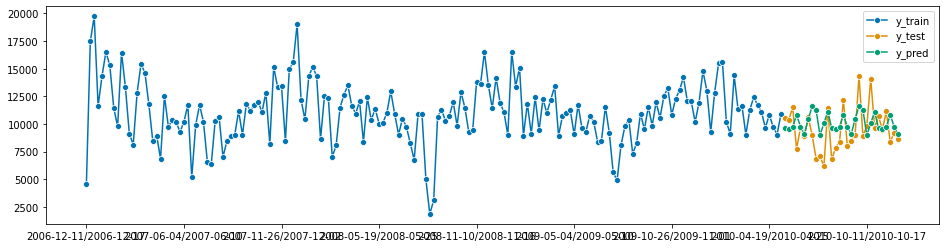

In [ ]:
forecaster = BATS(  
    use_box_cox=False,
    use_trend=False,
    use_damped_trend=False,
    sp=12,
    use_arma_errors=False,
    n_jobs=1)
forecaster.fit(y_train)
y_pred_benchmark = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred_benchmark, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred_benchmark, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred_benchmark))

### Complex Exponential Smoothing

A Exponential Smoothing model introduced from the paper
https://eprints.lancs.ac.uk/id/eprint/82749/1/2016svetunkovphd.pdf


In [ ]:
from statsforecast.models import AutoCES


0.20640464548544107
2258.4787568862484
CPU times: user 33.3 s, sys: 333 ms, total: 33.7 s
Wall time: 33.4 s


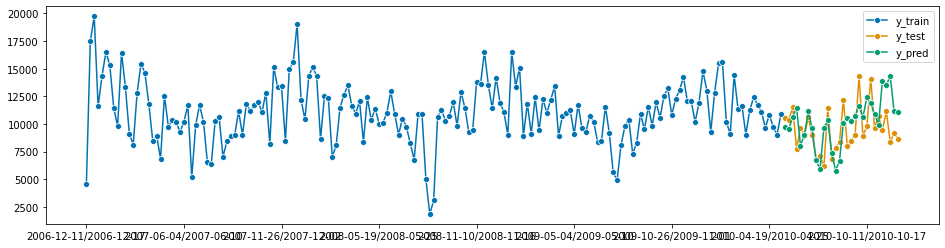

In [ ]:
%%time
forecaster =AutoCES(season_length=52, model='Z')
forecaster.fit(y=y_train.to_numpy().reshape(-1))
y_pred = forecaster.predict(h=len(fh))
y_pred=pd.DataFrame(index=y_test.index ,data=y_pred['mean'],columns=['Global_active_power'])
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

### Auto ARIMA

##### PmdARIMA

In [ ]:

# Algorithms for the model
from sktime.forecasting.tbats import TBATS
from sktime.forecasting.arima import AutoARIMA as pmdAutoArima

0.20640464548544107
2258.4787568862484
CPU times: user 6min 44s, sys: 3min 48s, total: 10min 33s
Wall time: 5min 33s


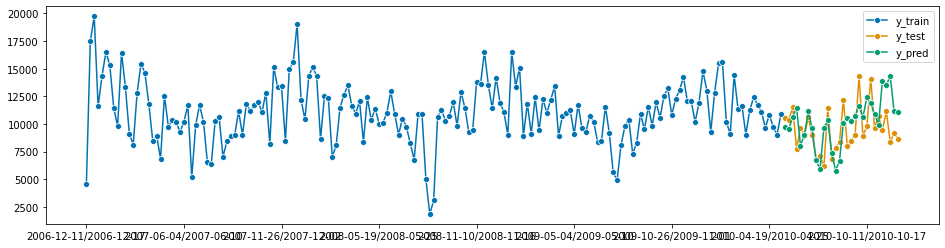

In [ ]:
%%time
forecaster = pmdAutoArima(sp=53, max_D=1, max_p=6, max_q=6,max_P=6,max_Q=6, suppress_warnings=True,n_jobs=-1) 
forecaster.fit(y_train)
y_pred_benchmark = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

In [ ]:
forecaster.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                    y   No. Observations:                  179
Model:             SARIMAX(0, 0, 5)x(0, 0, [1], 53)   Log Likelihood               -1640.841
Date:                              Fri, 28 Oct 2022   AIC                           3297.682
Time:                                      15:40:41   BIC                           3323.181
Sample:                                  12-17-2006   HQIC                          3308.021
                                       - 05-16-2010                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   1.079e+04    355.857     30.325      0.000    1.01e+04    1.15e+04
ma.L1          0.3579      0.062      5.751      0.000       0.236       0.480
ma.L2          0.0974      0.080      1.221      0.222      -0.059       0.254
ma.L3         -0.0999      0.075     -1.336      0.181      -0.246       0.047
ma.L4          0.2308      0.086      2.674      0.008       0.062       0.400
ma.L5          0.2317      0.071      3.275      0.001       0.093       0.370
ma.S.L53       0.2123      0.098      2.157      0.031       0.019       0.405
sigma2       5.28e+06   5.08e+05     10.395      0.000    4.28e+06    6.28e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 6.37
Prob(Q):                              0.90   Prob(JB):                         0.04
Heteroskedasticity (H):               0.35   Skew:                             0.22
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.81
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

##### NIXTLA ARIMA

In [ ]:
from statsforecast.models import AutoARIMA

0.23811529397253778
2703.149300734567
CPU times: user 50.7 s, sys: 887 ms, total: 51.6 s
Wall time: 51.4 s


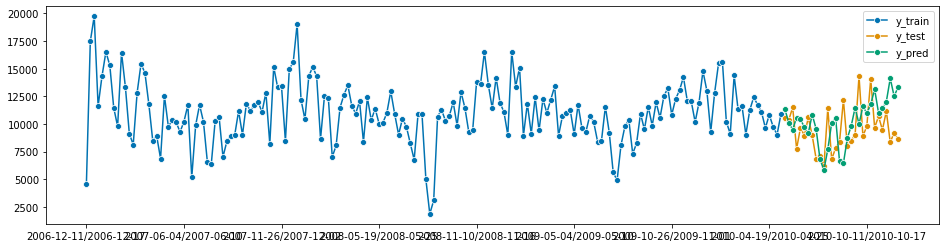

In [ ]:
%%time
forecaster =AutoARIMA(max_D=1, max_p=6, max_q=6,max_P=6,max_Q=6,season_length=53)
forecaster.fit(y=y_train.to_numpy().reshape(-1))
y_pred = forecaster.predict(h=len(fh))
y_pred=pd.DataFrame(index=y_test.index ,data=y_pred['mean'],columns=['Global_active_power'])
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

In here we clearly see that the NIXTLA Implementation of AUTO ARIMA is superior in terms of computational power in comparison to the PmdARIMA approach thus this would be the more optimal approach

### TBATS
Another Version from the BATS model with trigonometric seasonality

0.2122750342161127
2178.6271098460043
CPU times: user 2.45 s, sys: 1.33 s, total: 3.78 s
Wall time: 1min 57s


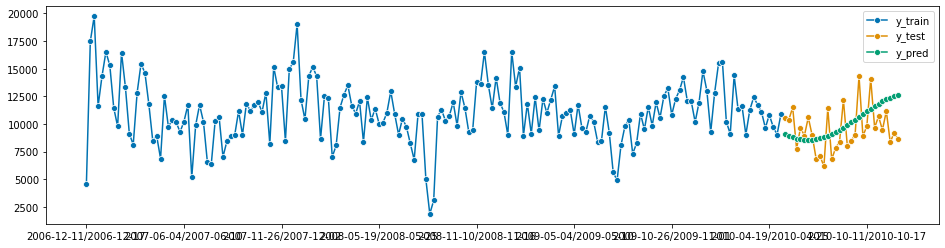

In [ ]:
%%time
forecaster = TBATS(use_box_cox=None,use_trend=None ,use_arma_errors=True ,use_damped_trend=None,sp=52,n_jobs=-1)
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))


### Sliding Window ML Models

In [ ]:
from sktime.forecasting.compose import make_reduction
from lightgbm.sklearn import LGBMRegressor
from sklearn.ensemble import HistGradientBoostingRegressor,GradientBoostingRegressor,AdaBoostRegressor,RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

#### RandomForest 
I changed the base regressor to gradientboosting algorithms however this had no effect on the dataset

DecisionTreeRegressor()
DecisionTreeRegressor()
0.18366930284573849
1909.6202881442532
CPU times: user 1.18 s, sys: 103 ms, total: 1.28 s
Wall time: 1.33 s


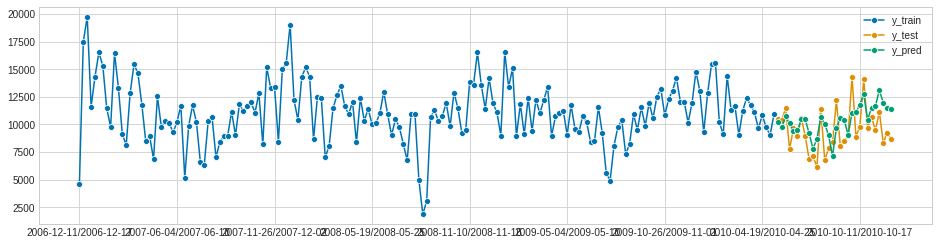

In [ ]:
%%time
regressor = RandomForestRegressor()
print(regressor.base_estimator)
#regressor.base_estimator=LGBMRegressor()
print(regressor.base_estimator)
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

#### LightGBM

0.21183538576027652
2387.815118556485
CPU times: user 260 ms, sys: 105 ms, total: 366 ms
Wall time: 217 ms


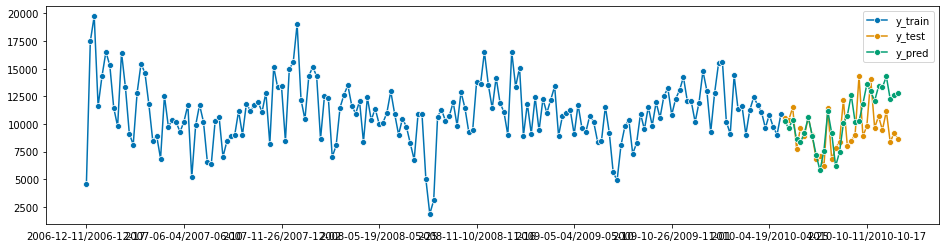

In [ ]:
%%time
regressor = LGBMRegressor()
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

#### XGboost

0.18577479583634884
1949.4583008650718
CPU times: user 274 ms, sys: 95.4 ms, total: 370 ms
Wall time: 286 ms


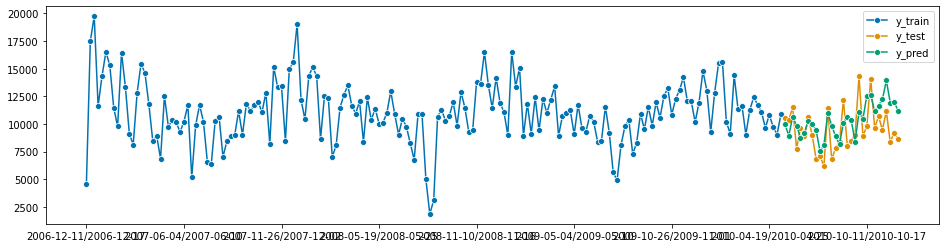

In [ ]:
%%time
regressor = XGBRegressor(objective='reg:squarederror')
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

#### CatBoost

0.1940387472660244
2081.732511066374
CPU times: user 15.4 s, sys: 2.35 s, total: 17.7 s
Wall time: 19.7 s


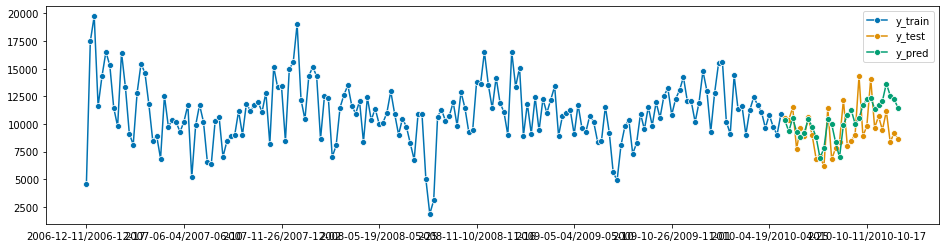

In [ ]:
%%time
regressor = CatBoostRegressor(silent=True)
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive",scitype='tabular-regressor')
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

####Adaboost 

0.20037120074919146
2019.9709327639073
CPU times: user 645 ms, sys: 37.4 ms, total: 682 ms
Wall time: 847 ms


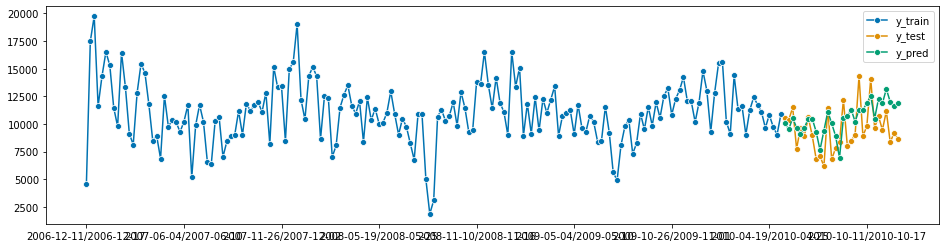

In [ ]:
%%time
regressor = AdaBoostRegressor()
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive",scitype='tabular-regressor')
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

#### HistGradientBoosting

0.21102554583606448
2441.3882284425963
CPU times: user 4.68 s, sys: 93.7 ms, total: 4.77 s
Wall time: 5.45 s


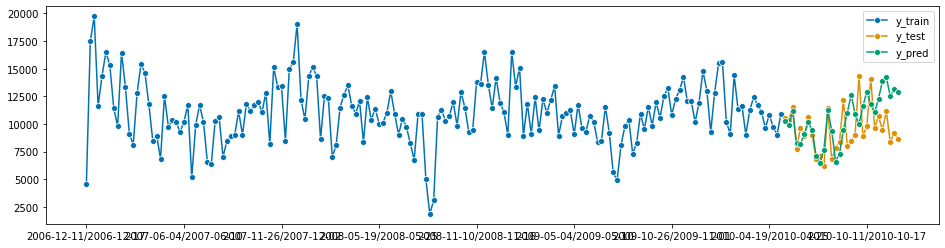

In [ ]:
%%time
regressor = HistGradientBoostingRegressor()
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

#### MLP

In [ ]:
from tensorflow import keras
import keras
from keras.models import Sequential
from keras.layers import Dense
from scikeras.wrappers import KerasRegressor

In [ ]:
def MLP_Keras(windowsize,optimizer='adam'):
  model = Sequential()
  model.add(Dense(100, activation='relu', input_dim=windowsize))
  #model.add(Dense(100, activation='relu', input_dim=int(365/12)))
  #model.add(Dense(100, activation='relu', input_dim=int(365/12)))
  model.add(Dense(1))
  model.compile(optimizer=optimizer, loss='mse')
  return model

0.24093149833442135
2455.055026576782
CPU times: user 4.43 s, sys: 322 ms, total: 4.76 s
Wall time: 5.64 s


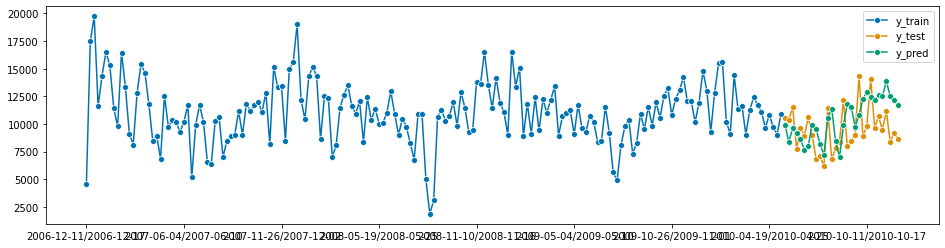

In [ ]:
%%time
regressor = KerasRegressor(model=MLP_Keras(int(52)), epochs=100, batch_size=None, verbose=0)
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

#### Adaboost with MLP as a base estimator
This proved to be the best method as to this dataset. The use of neural networks as a base estimator for adaboost works best.

0.2527299268352453
2655.0573848565646
CPU times: user 42.8 s, sys: 1.68 s, total: 44.5 s
Wall time: 45.2 s


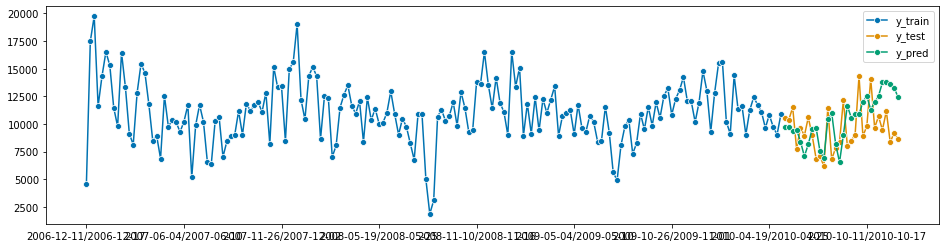

In [ ]:
%%time

regressor = AdaBoostRegressor(base_estimator=KerasRegressor(model=MLP_Keras(int(52)), epochs=100, batch_size=None, verbose=0,),n_estimators=10)
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

#### More Advanced MLP Model

In [ ]:
def MLP_Keras_Complex(windowsize,optimizer='adam'):
  inputs = keras.Input(shape=(windowsize,))
  hidden1 = keras.layers.Dense(windowsize*12, activation="relu")(inputs)
  hidden2 = keras.layers.Dense(windowsize*4, activation="relu")(inputs)
  hidden3 = keras.layers.Dense(windowsize*8, activation="relu")(inputs)
  concat = keras.layers.concatenate([hidden1, hidden2,hidden3])
  output =keras.layers.Dense(1)(concat)
  model = keras.models.Model(inputs=[inputs], outputs=[output])
  model.compile(optimizer=optimizer, loss='mse')
  return model

0.22440434961459937
2375.6766621059237
CPU times: user 5.24 s, sys: 317 ms, total: 5.56 s
Wall time: 5.34 s


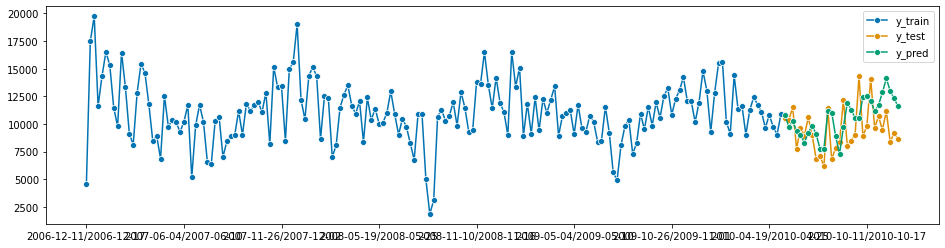

In [ ]:
%%time
regressor = KerasRegressor(model=MLP_Keras_Complex(int(52)), epochs=100, batch_size=None, verbose=0)
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

#### Adaboost with MLP as Estimator 2 Variant

0.20667062214771165
2274.4623255964366
CPU times: user 4min 35s, sys: 9.76 s, total: 4min 44s
Wall time: 4min 33s


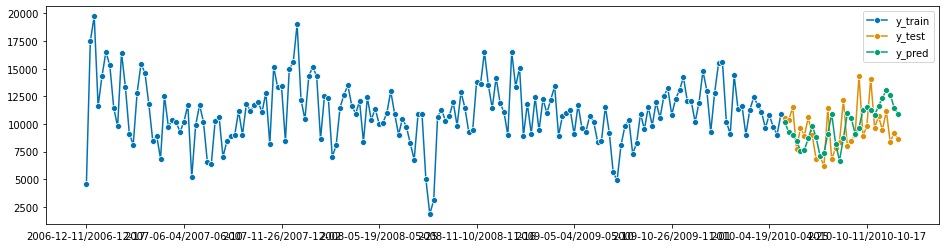

In [ ]:
%%time
regressor = AdaBoostRegressor(base_estimator=KerasRegressor(model=MLP_Keras_Complex(int(52)), epochs=100, batch_size=None, verbose=0))
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

#### CNN

In [ ]:
import absl.logging
absl.logging.set_verbosity(absl.logging.ERROR)

In [ ]:
def CNN(windowsize,optimizer='adam'):
  from keras.layers import Conv1D,MaxPooling1D,Flatten,Conv2D,MaxPooling2D
  model = Sequential()
  model.add(Conv1D(filters=12, kernel_size=4 #Kernel_size is associated with window size
                    , activation='relu', batch_input_shape=(None, windowsize, 1),dilation_rate=1))

  model.add(MaxPooling1D(pool_size=1))
  model.add(Flatten())
  #model.add(Dense(50, activation='relu'))
  model.add(Dense(1))
  model.compile(optimizer='adam', loss='mse')
  return model 

0.25059485206015203
2551.5550286537464
CPU times: user 7.44 s, sys: 450 ms, total: 7.89 s
Wall time: 7.82 s


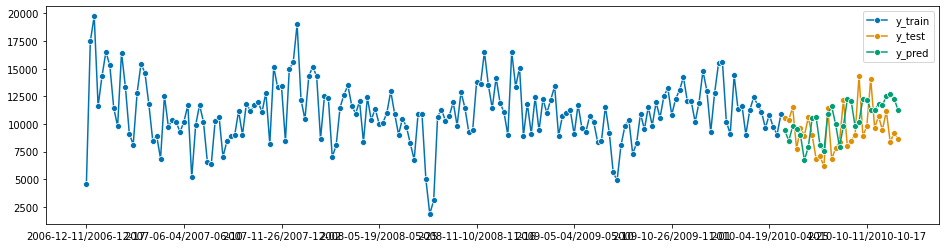

In [ ]:
%%time
regressor = KerasRegressor(model=CNN(int(52)), epochs=100, batch_size=None, verbose=0)
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

0.23951540813085212
2621.001985759823
CPU times: user 49.6 s, sys: 1.59 s, total: 51.2 s
Wall time: 50.1 s


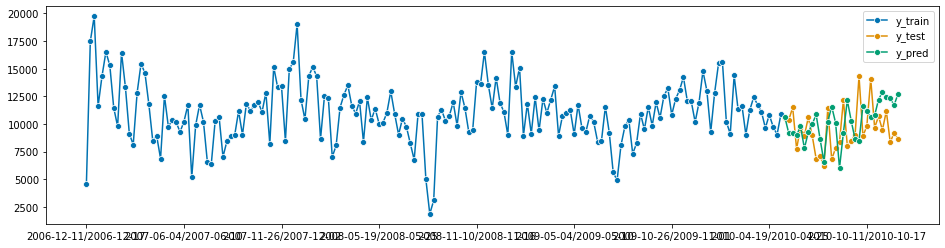

In [ ]:
%%time
regressor = AdaBoostRegressor(base_estimator=KerasRegressor(model=CNN(int(52)), epochs=100, batch_size=None, verbose=0),n_estimators=10)
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

#### LSTM Neural Network

In [ ]:
import tensorflow as tf
tf.get_logger().setLevel('ERROR')

In [ ]:
def LSTM(windowsize,optimizer='adam'):
  from keras.layers import Bidirectional
  from keras.layers import LSTM
  from keras.layers import Dense
  model = Sequential()
  model.add(tf.keras.layers.Reshape((1,windowsize), input_shape=(windowsize,)))
  model.add(Bidirectional(LSTM(50, activation='relu',return_sequences=True)))
  model.add(Bidirectional(LSTM(50, activation='relu',return_sequences=False)))
  #model.add(LSTM(50, activation='relu',return_sequences=True))
  #model.add(LSTM(50, activation='relu'))
  #model.add(Dense(100, activation='relu', input_dim=50))
  #model.add(Dense(100, activation='relu'))
  #model.add(LSTM(50, activation='tanh',return_sequences=True))
  model.add(Dense(1))
  model.compile(loss="mse", optimizer=keras.optimizers.Adam(learning_rate=0.01), metrics=['mean_squared_error'])
  return model

0.2036507847299747
2134.0033465479687
CPU times: user 35 s, sys: 866 ms, total: 35.8 s
Wall time: 40.1 s


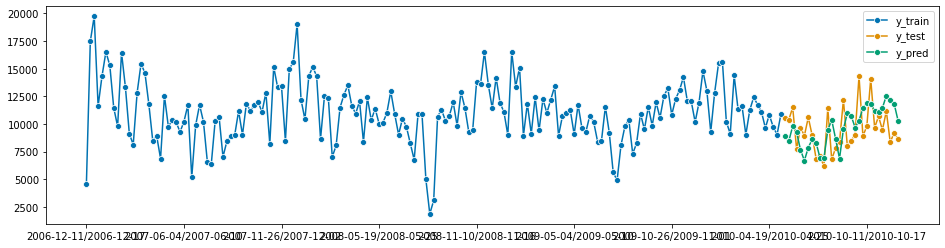

In [ ]:
%%time
regressor = KerasRegressor(model=LSTM(int(52)), epochs=100, batch_size=None, verbose=0)
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

0.2081215750719952
2240.4288832813977
CPU times: user 5min 48s, sys: 10.2 s, total: 5min 58s
Wall time: 5min 44s


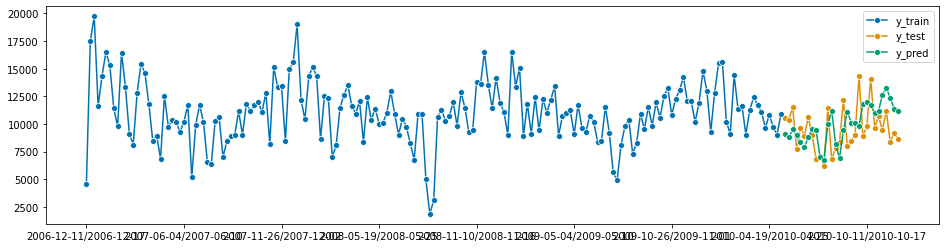

In [ ]:
%%time
regressor = AdaBoostRegressor(base_estimator=KerasRegressor(model=LSTM(int(52)), epochs=100, batch_size=None, verbose=0),n_estimators=10)
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

#### GRU

In [ ]:
def GRU(windowsize,optimizer='adam'):

  from keras.layers import GRU,LSTM
  from keras.layers import Dense
  model = Sequential()
  model.add(tf.keras.layers.Reshape((1,windowsize), input_shape=(windowsize,)))
  model.add(GRU(50, activation='relu',return_sequences=True))
  model.add(GRU(50, activation='relu'))
  model.add(Dense(100, activation='relu', input_dim=50))
  model.add(Dense(100, activation='relu'))
  #model.add(LSTM(50, activation='tanh',return_sequences=True))
  model.add(Dense(1))
  model.compile(loss="mse", optimizer=keras.optimizers.Adam(learning_rate=0.01), metrics=['mean_squared_error'])
  return model

0.1883142592458276
2012.881861636833
CPU times: user 17.7 s, sys: 372 ms, total: 18.1 s
Wall time: 20 s


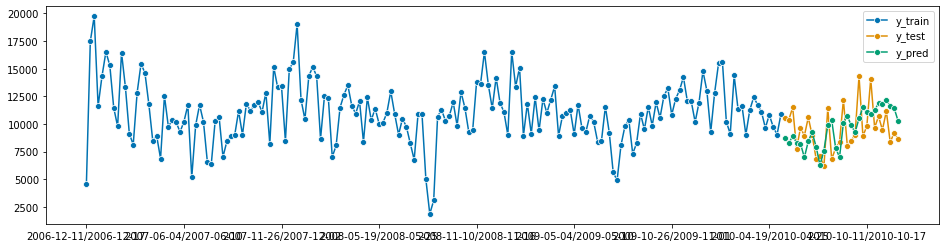

In [ ]:
%%time
regressor = KerasRegressor(model=GRU(int(53)), epochs=100, batch_size=None, verbose=0)
forecaster = make_reduction(regressor, window_length=int(53), strategy="recursive")
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

0.21146288746575367
2342.567557295696
CPU times: user 3min 1s, sys: 5 s, total: 3min 6s
Wall time: 2min 56s


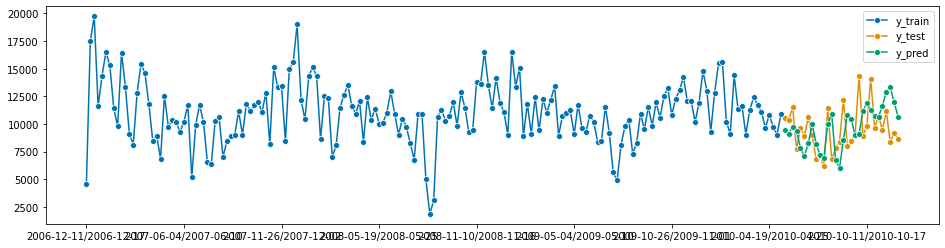

In [ ]:
%%time
regressor = AdaBoostRegressor(base_estimator=KerasRegressor(model=GRU(int(52)), epochs=100, batch_size=None, verbose=0),n_estimators=10)
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

#### CNN GRU Model

In [ ]:
def CNNLSTM(windowsize,optimizer='adam',):
  from keras.layers import Conv1D,MaxPooling1D,Flatten,LSTM,Dense,GRU,AveragePooling1D
  filter=16
  KernelSize=6
  poolsize=2
  model = Sequential()
 #print(model.output_shape[1])
  model.add(Conv1D(filters=filter, kernel_size=KernelSize #Kernel_size is associated with window size
                    , activation='relu', batch_input_shape=(None, windowsize, 1)))
  model.add(MaxPooling1D(pool_size=poolsize))
  model.add(Flatten())
  model.add(tf.keras.layers.Reshape((1,model.output_shape[1]), input_shape=(model.output_shape[1],)))
  model.add(GRU(100, activation='relu',return_sequences=False))
  #model.add(Dense(100, activation='relu', input_dim=50))
  model.add(Dense(1))
  model.compile(loss="mse", optimizer=keras.optimizers.Adam(learning_rate=0.01), metrics=['mean_squared_error'])
  return model

0.25155170588404724
2699.4863306510656


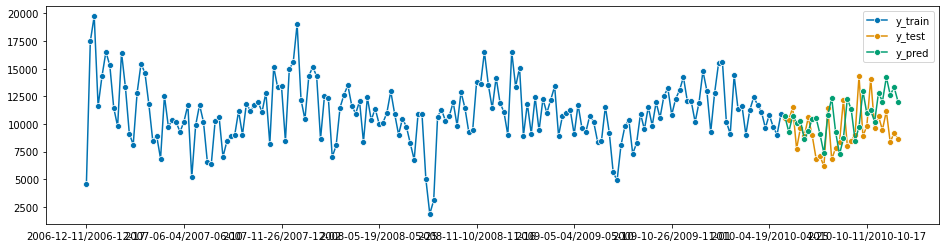

In [ ]:
regressor = KerasRegressor(model=CNNLSTM(int(52)), epochs=100, batch_size=None, verbose=0)
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y=y_train,fh=fh)
y_pred = forecaster.predict()
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

0.21646847655897167
2373.564627354865
CPU times: user 2min 21s, sys: 4.61 s, total: 2min 26s
Wall time: 2min 26s


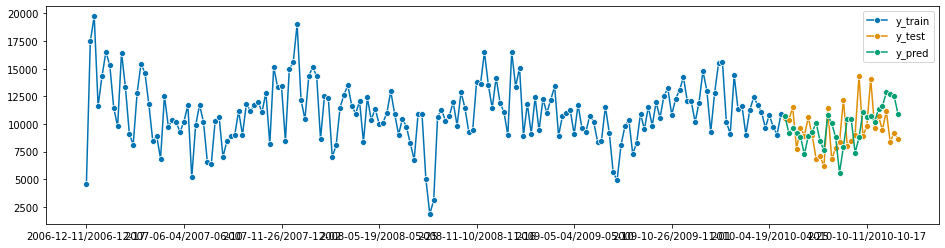

In [ ]:
%%time
regressor = AdaBoostRegressor(base_estimator=KerasRegressor(model=CNNLSTM(int(52)), epochs=100, batch_size=None, verbose=0),n_estimators=10)
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

### Multivariate Models

#### Causal Inference

In [ ]:
from causal_ccm.causal_ccm import ccm

In [ ]:
AggregatedData1=FinalizedDataFrame.resample('1W', label='right', closed = 'right', on='DateTime').sum().reset_index()


In [ ]:
# get the variables we want to check causality on
X = AggregatedData1['Global_active_power'].reset_index(drop=True)

Y = AggregatedData1['Voltage'].reset_index(drop=True)
tau = 1 # time lag
E = 2 # shadow manifold embedding dimensions
L = len(X) # length of time period to consider
L_range = range(156, len(X), 1) # L values to test
tau = 1
E = 2

In [ ]:
from itertools import chain, combinations
from tqdm import tqdm

def powerset(iterable):
    "powerset([1,2,3]) --> () (1,) (2,) (3,) (1,2) (1,3) (2,3) (1,2,3)"
    s = list(iterable)
    return chain.from_iterable(combinations(s, r) for r in range(len(s)+1))


In [ ]:
XCols=[]
YCols=[]
XToY=[]
YToX=[]
XToYPvalue=[]
YToXPvalue=[]
for i in range(len(list(powerset(set(AggregatedData1.columns[1:]))))):
  if len(list(powerset(set(AggregatedData1.columns[1:])))[i])==2:
    XCols.append(list(powerset(set(AggregatedData1.columns[1:])))[i][0])
    YCols.append(list(powerset(set(AggregatedData1.columns[1:])))[i][1])

for i in tqdm(range(len(XCols))):
  X = AggregatedData1[XCols[i]].reset_index(drop=True)
  Y = AggregatedData1[YCols[i]].reset_index(drop=True)
  ccm1 = ccm(X, Y, tau, E, L)
  Xhat_My, Yhat_Mx = [], [] # correlation list
  for L in L_range: 
      ccm_XY = ccm(X, Y, tau, E, L) # define new ccm object # Testing for X -> Y
      ccm_YX = ccm(Y, X, tau, E, L) # define new ccm object # Testing for Y -> X    
      Xhat_My.append(ccm_XY.causality()[0]) 
      Yhat_Mx.append(ccm_YX.causality()[0]) 
      
  #print('X->Y r', np.round(Xhat_My[-1], 2), 'p value', np.round(ccm_XY.causality()[1], 4))
  #print('Y->X r', np.round(Yhat_Mx[-1], 2), 'p value', np.round(ccm_YX.causality()[1], 4))    

  XToY.append(np.round(Xhat_My[-1], 2))
  YToX.append(np.round(Xhat_My[-1], 2))
  XToYPvalue.append(np.round(ccm_XY.causality()[1], 4))
  YToXPvalue.append(np.round(ccm_YX.causality()[1], 4))
CausalityDataFrame=pd.DataFrame()
CausalityDataFrame['XCol']=XCols
CausalityDataFrame['YCol']=YCols
CausalityDataFrame['XToYR']=XToY
CausalityDataFrame['YToXR']=YToX
CausalityDataFrame['XToYPvalue']=XToYPvalue
CausalityDataFrame['YToXPvalue']=YToXPvalue

100%|██████████| 21/21 [00:30<00:00,  1.43s/it]


In [ ]:
CausalRelationships=CausalityDataFrame.loc[(CausalityDataFrame['XToYPvalue']<0.05) | (CausalityDataFrame['YToXPvalue']<0.05)].copy()

In [ ]:
def getXcolumnsforY(Y):

  ColumnsToForecast=[]
  for i, row in CausalRelationships.loc[(CausalRelationships['XCol']==Y)|(CausalRelationships['YCol']==Y)][['XCol','YCol']].items():
    for rowitems in row:
      if rowitems!=Y:
        ColumnsToForecast.append(rowitems)
  return ColumnsToForecast

In [ ]:
TargetColumn='Global_active_power'
Y=AggregatedData1[TargetColumn]
XColumns=getXcolumnsforY(TargetColumn)
X=AggregatedData1[XColumns]

#### Modeling

Seasonal Decomposition to understand Seasonal Components

In [ ]:
from statsmodels.tsa.seasonal import STL
res = STL(Y,period=53).fit()


In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [ ]:
SD4=seasonal_decompose(np.array(Y).reshape(-1,1),period=4)
SD5 = seasonal_decompose(np.array(Y).reshape(-1,1) - np.array(SD4.seasonal).reshape(-1,1), period=5)
SD16 = seasonal_decompose(np.array(Y).reshape(-1,1) - np.array(SD5.seasonal).reshape(-1,1), period=16)
SD53 = seasonal_decompose(np.array(Y).reshape(-1,1) - np.array(SD16.seasonal).reshape(-1,1), period=53)

In [ ]:
Resid=(np.array(Y)-(SD53.trend+SD53.seasonal+SD16.seasonal+SD5.seasonal+SD4.seasonal))

In [ ]:
pd.DataFrame(Resid).describe()

,0
count,157.000000
mean,-18.794129
std,1780.306957
min,-4449.552261
25%,-1215.681842
50%,-5.665406
75%,1420.152466
max,3841.876905


##### Setting up a multivariate Model

In [ ]:

y_train1, y_test1,X_train, X_test = temporal_train_test_split(X=X,y=Y, test_size=30)
#fh = ForecastingHorizon(y_test1.index, is_relative=False)
fh=ForecastingHorizon([i for i in range(1,len(y_test1)+1)])

In [ ]:
AggregatedData1=FinalizedDataFrame.resample('1W', label='right', closed = 'right', on='DateTime').sum().reset_index()


#### CNNLSTM

In [ ]:
def Multivariate_CNNLSTM(windowsize,optimizer='adam',):
  from keras.layers import Conv1D,MaxPooling1D,Flatten,LSTM,Dense,GRU,AveragePooling1D
  filter=32
  KernelSize=4
  poolsize=1
  model = Sequential()
  model.add(Conv1D(filters=filter, kernel_size=KernelSize #Kernel_size is associated with window size
                    , activation='relu', batch_input_shape=(None, 312, 1)))
  model.add(MaxPooling1D(pool_size=poolsize))
  model.add(Flatten())
  model.add(tf.keras.layers.Reshape((1,model.output_shape[1]), input_shape=(model.output_shape[1],)))
  model.add(GRU(100, activation='relu',return_sequences=False))
  #model.add(Dense(100, activation='relu', input_dim=50))
  model.add(Dense(1))
  model.compile(loss="mse", optimizer=keras.optimizers.Adam(learning_rate=0.01), metrics=['mean_squared_error'])
  return model

4335.362602313742


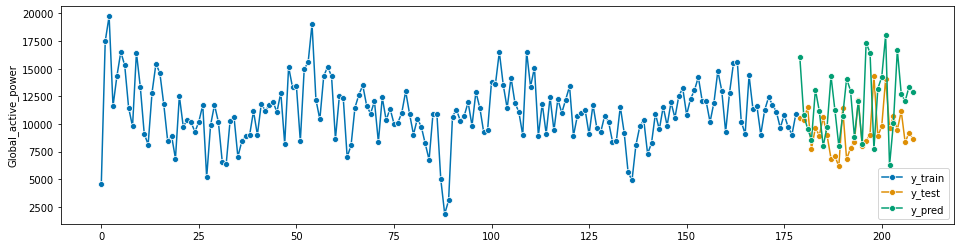

In [ ]:
regressor = KerasRegressor(model=Multivariate_CNNLSTM(int(52)+len(X.columns)), epochs=300, batch_size=None, verbose=0)
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y=y_train1,X=X_train,fh=fh)
y_pred = forecaster.predict(X=X_test)
plot_series(y_train1, y_test1, y_pred, labels=["y_train", "y_test", "y_pred"])
mean_absolute_percentage_error(y_test1, y_pred, symmetric=False)
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test1, y_pred))

#### LGBM

2136.861992674216


0.19492012399003944

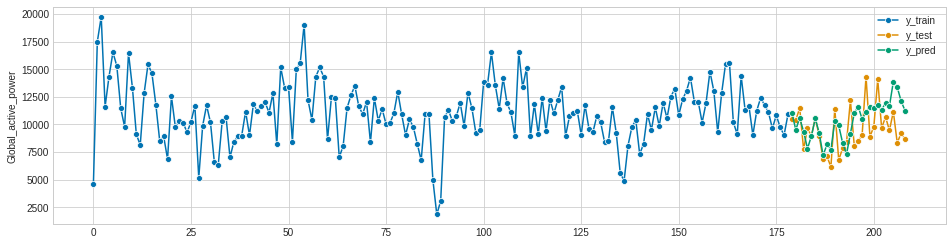

In [ ]:
regressor = LGBMRegressor()
forecaster = make_reduction(regressor, window_length=int(53), strategy="recursive")
forecaster.fit(y=y_train1,X=X_train,fh=fh)
y_pred = forecaster.predict(X=X_test)
plot_series(y_train1, y_test1, y_pred, labels=["y_train", "y_test", "y_pred"])

rmse=MeanSquaredError( square_root=True)
print(rmse(y_test1, y_pred))
mean_absolute_percentage_error(y_test1, y_pred, symmetric=False)

[16:04:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
2204.785023133741


0.20519167262987195

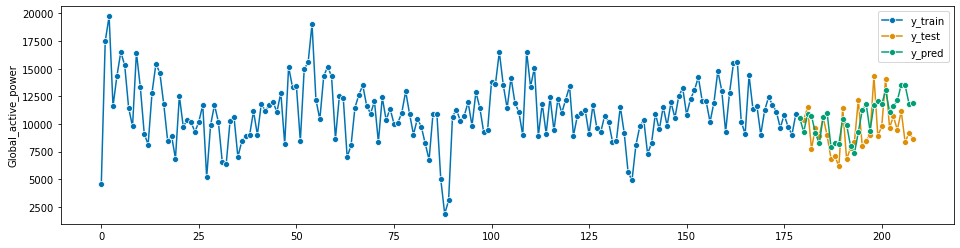

In [ ]:
regressor = XGBRegressor()
forecaster = make_reduction(regressor, window_length=int(53), strategy="recursive")
forecaster.fit(y=y_train1,X=X_train,fh=fh)
y_pred = forecaster.predict(X=X_test)
plot_series(y_train1, y_test1, y_pred, labels=["y_train", "y_test", "y_pred"])
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test1, y_pred))
mean_absolute_percentage_error(y_test1, y_pred, symmetric=False)

### Ensemble Forecasting Models

In [ ]:
%%capture
AggregatedData=FinalizedDataFrame.resample('1W', label='right', closed = 'right', on='DateTime').sum().reset_index()
BottomCausal=AggregatedData[['DateTime','Global_active_power']].copy()
BottomCausal['DateTime']=BottomCausal['DateTime'].dt.to_period()
y_train, y_test = temporal_train_test_split(BottomCausal.set_index('DateTime')[['Global_active_power']], test_size=30)
fh = ForecastingHorizon(y_test.index, is_relative=False)


In [ ]:
from sktime.forecasting.compose import AutoEnsembleForecaster
from sktime.forecasting.trend import STLForecaster

In [ ]:
from sklearn.linear_model import ElasticNet,LinearRegression
from sktime.forecasting.ets import AutoETS

In [ ]:
#Neural Network
from tensorflow import keras
from keras.layers import Dense
from keras.models import Sequential
from keras.layers import LSTM
from scikeras.wrappers import KerasRegressor

In [ ]:
import tensorflow as tf

[16:04:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
2003.9166092163239


0.17985747785501743

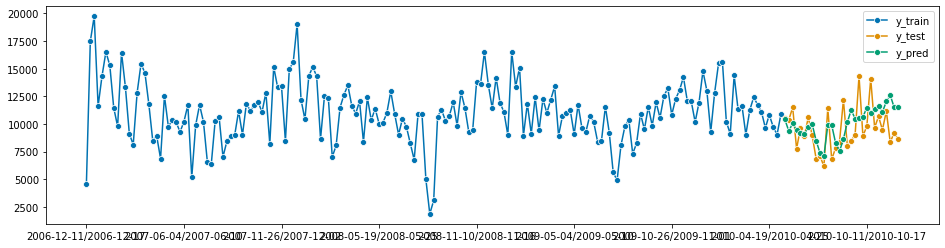

In [ ]:
forecasters = [
    #("StatisticalModel1",  AutoETS(auto=True, n_jobs=-1, sp=int(53))),
    #("StatisticalModel1",  pmdAutoArima(sp=53, max_D=1, max_p=6, max_q=6,max_P=6,max_Q=6, suppress_warnings=True,n_jobs=-1) ),
    ("StatisticalModel2",  AutoETS(auto=True, n_jobs=-1, sp=int(53))),
    ("STLModel1",  STLForecaster(sp=int(53))),
    ("STLModel2",  STLForecaster(sp=int(5))),
    ("STLModel3",  STLForecaster(sp=int(16))),
    ("SlidingWindow1",  make_reduction(LGBMRegressor(), window_length=int(53), strategy="recursive")),
]
forecaster = AutoEnsembleForecaster(forecasters=forecasters,regressor=XGBRegressor())
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))
mean_absolute_percentage_error(y_test, y_pred, symmetric=False)

In [ ]:
forecasters1 = [
    #("STLModel1",  STLForecaster(sp=int(5))),
    #("STLModel2",  STLForecaster(sp=int(26))),
    #("STLModel3",  STLForecaster(sp=int(5))),
    #("STLModel4",  STLForecaster(sp=int(365/4))),
    ("SlidingWindow1",  make_reduction(XGBRegressor(), window_length=int(53), strategy="recursive")),
    ("SlidingWindow2", make_reduction(XGBRegressor(), window_length=int(26), strategy="recursive")),
    ("SlidingWindow3", make_reduction(XGBRegressor(), window_length=int(5), strategy="recursive")),
    ("SlidingWindow4", make_reduction(XGBRegressor(), window_length=int(4), strategy="recursive")),
    #("SlidingWindow5", make_reduction(XGBRegressor(), window_length=int(7), strategy="recursive")),
    #("SlidingWindow4", make_reduction(LGBMRegressor(), window_length=int(365/4), strategy="recursive")),
    #("SlidingWindow5", make_reduction(LGBMRegressor(), window_length=int(365/7), strategy="recursive")),
    #("NNModel1",make_reduction(KerasRegressor(model=GRU(int(53)), epochs=100, batch_size=None, verbose=0), window_length=int(53), strategy="recursive")),
    #("NNModel2",make_reduction(KerasRegressor(model=GRU(int(26)), epochs=100, batch_size=None, verbose=0), window_length=int(26), strategy="recursive")),
    #("NNModel3",make_reduction(KerasRegressor(model=GRU(int(5)), epochs=100, batch_size=None, verbose=0), window_length=int(5), strategy="recursive")),
    #("NNModel3",  make_reduction(KerasRegressor(model=LSTM, epochs=50, batch_size=10, verbose=0), window_length=int(365/12), strategy="recursive")),
    #("NNModel4",  make_reduction(KerasRegressor(model=LSTM, epochs=50, batch_size=10, verbose=0), window_length=int(365/12), strategy="recursive")),
]
forecaster = AutoEnsembleForecaster(forecasters=forecasters1,regressor=LGBMRegressor())
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))
mean_absolute_percentage_error(y_test, y_pred, symmetric=False)

##### Using Ensemble Forecasting Methods with Multivariate Data

In [ ]:
y_train1, y_test1,X_train, X_test = temporal_train_test_split(X=X,y=Y, test_size=30)
#fh = ForecastingHorizon(y_test1.index, is_relative=False)
fh=ForecastingHorizon([i for i in range(1,len(y_test1)+1)])

1900.855420247094


0.16052786939854027

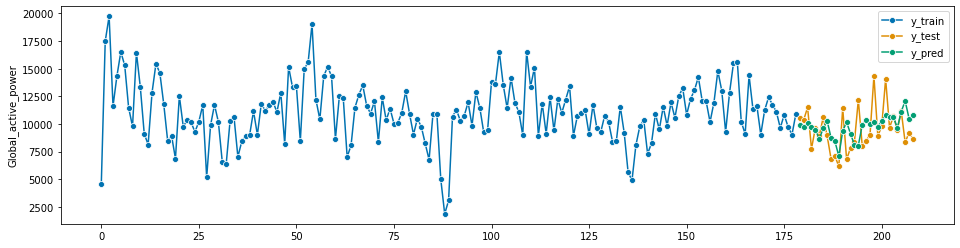

In [ ]:

forecaster = AutoEnsembleForecaster(forecasters=forecasters,regressor=LGBMRegressor())
forecaster.fit(y=y_train1,X=X_train,fh=fh)
y_pred = forecaster.predict(X=X_test)
plot_series(y_train1, y_test1, y_pred, labels=["y_train", "y_test", "y_pred"])
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))
mean_absolute_percentage_error(y_test, y_pred, symmetric=False)

[16:05:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:05:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:05:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:05:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:05:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:05:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:05:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:05:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

0.19735410657855804

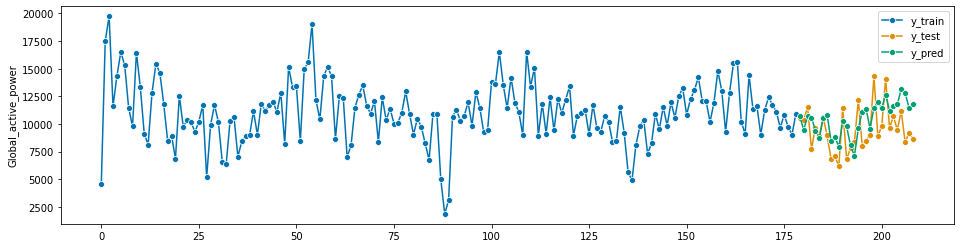

In [ ]:
forecaster = AutoEnsembleForecaster(forecasters=forecasters1,regressor=LGBMRegressor())
forecaster.fit(y=y_train1,X=X_train,fh=fh)
y_pred = forecaster.predict(X=X_test)
plot_series(y_train1, y_test1, y_pred, labels=["y_train", "y_test", "y_pred"])
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))
mean_absolute_percentage_error(y_test, y_pred, symmetric=False)

###### Forecasting Individual Components of STL decomposition

In [ ]:
%%capture
AggregatedData=FinalizedDataFrame.resample('1W', label='right', closed = 'right', on='DateTime').sum().reset_index()
y_train, y_test = temporal_train_test_split(BottomCausal.set_index('DateTime')[['Global_active_power']], test_size=53)
fh = ForecastingHorizon(y_test.index, is_relative=False)

###### Baseline

0.16191266258175183
1952.6381303729672
CPU times: user 272 ms, sys: 106 ms, total: 378 ms
Wall time: 276 ms


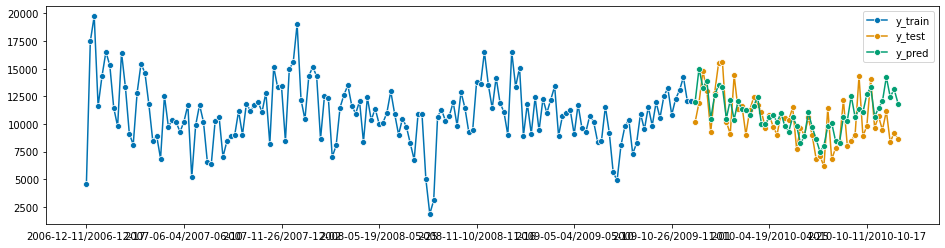

In [ ]:
%%time
regressor = XGBRegressor(objective='reg:squarederror')
forecaster = make_reduction(regressor, window_length=int(52), strategy="recursive")
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
print(mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))

###### STL Approach Model

In [ ]:
res = STL(y_train,period=53).fit()
y_trainS = res.seasonal
y_trainT = res.trend
y_trainR = res.resid

In [ ]:
resValidation = STL(Y,period=53).fit()
y_trainSV, y_testSV = temporal_train_test_split(resValidation.seasonal, test_size=53)
y_trainTV, y_testTV = temporal_train_test_split(resValidation.trend, test_size=53)
y_trainRV, y_testRV = temporal_train_test_split(resValidation.resid, test_size=53)


In [ ]:
forecasterS = make_reduction(XGBRegressor(), window_length=int(53), strategy="recursive")
forecasterS.fit(y=y_trainS)
y_predS = forecasterS.predict(fh)
print(mean_absolute_percentage_error(y_testSV, y_predS, symmetric=False))

forecasterT = make_reduction(XGBRegressor(), window_length=int(53), strategy="recursive")
forecasterT.fit(y=y_trainT)
y_predT = forecasterT.predict(fh)
print(mean_absolute_percentage_error(y_testTV, y_predT, symmetric=False))

forecasterR = make_reduction(XGBRegressor(), window_length=int(53), strategy="recursive")
forecasterR.fit(y=y_trainR)
y_predR = forecasterR.predict(fh)
print(mean_absolute_percentage_error(y_testRV, y_predR, symmetric=False))


[16:05:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
2.3636077222046086
[16:05:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
0.047831643236257236
[16:05:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
3.5347204854884153


2932.765646039403


0.23843318499581048

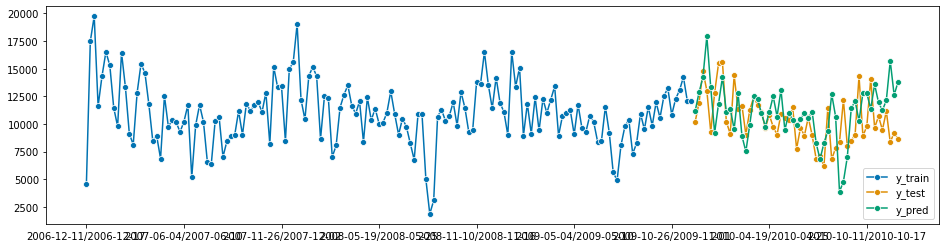

In [ ]:
plot_series(y_train, y_test, (y_predS+y_predT+y_predR), labels=["y_train", "y_test", "y_pred"])

rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, (y_predS+y_predT+y_predR)))
mean_absolute_percentage_error(y_test, (y_predS+y_predT+y_predR), symmetric=False)

##### Using the Forecasts of Seasonal Decomposition Into A sliding window model

In [ ]:
fh=ForecastingHorizon([i for i in range(1,len(y_test)+1)])

In [ ]:
X_train=pd.DataFrame()
X_test=pd.DataFrame()

In [ ]:
X_train['y_trainS']=y_trainS
X_train['y_trainT']=y_trainT
X_train['y_trainR']=y_trainR

In [ ]:
X_test['y_predS']=y_predS
X_test['y_predT']=y_predT
X_test['y_predR']=y_predR


[16:05:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
2129.318253236568


0.18354648646557847

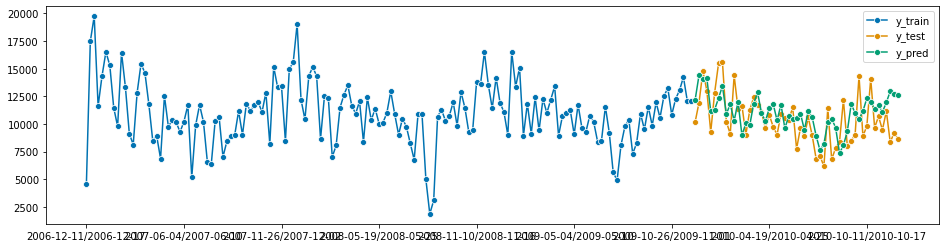

In [ ]:
regressor = XGBRegressor()
forecaster = make_reduction(regressor, window_length=int(53), strategy="recursive")
forecaster.fit(y=y_train,X=X_train,fh=fh)
y_pred = forecaster.predict(X=X_test)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
rmse=MeanSquaredError( square_root=True)
print(rmse(y_test, y_pred))
mean_absolute_percentage_error(y_test, y_pred, symmetric=False)

### SOTA DARTS Neural Networks

#### NBeats

In [ ]:
from darts import TimeSeries
from darts.models import NBEATSModel
from darts.dataprocessing.transformers import Scaler

In [ ]:
data=FinalizedDataFrame.resample('1W', label='right', closed = 'right', on='DateTime').sum()[['Global_active_power']]
data=data.reset_index()
data['DateTime'] = data['DateTime'].astype(str)
data['DateTime'] = pd.to_datetime(data['DateTime'])
y_train, y_test = temporal_train_test_split(data, test_size=16)

In [ ]:
series =TimeSeries.from_dataframe(y_train, 'DateTime', 'Global_active_power')
train, val = series[:-53], series[-53:]

In [ ]:
add_encoders={
    'cyclic': {'future': ['week']},
    'datetime_attribute': {'future': ['day', 'dayofweek']},
    'transformer': Scaler()
}

In [ ]:
transformer = Scaler()
train_transformed = transformer.fit_transform(train)
val_transformed = transformer.transform(val)
series_transformed = transformer.transform(series)

In [ ]:

model = NBEATSModel(
    #model="NBEATSModel",
    #hidden_dim=20,
    dropout=0,
    batch_size=16,
    n_epochs=100,
    optimizer_kwargs={"lr": 1e-3},
    model_name="Air_RNN",
    log_tensorboard=True,
    random_state=42,
    #training_length=53,
    input_chunk_length=26,
    output_chunk_length=1,
    force_reset=True,
    #pl_trainer_kwargs={
    #"accelerator": "cpu",
    #"gpus": [0]},
)
model.fit(train, val_series=val)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 6.2 M 
---------------------------------------------------
6.2 M     Trainable params
1.4 K     Non-trainable params
6.2 M     Total params
49.685    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


In [ ]:
y_pred=model.predict(len(y_test))

Predicting: 8it [00:00, ?it/s]

In [ ]:
y_pred=pd.DataFrame(y_pred.values(),columns=['Global_active_power'])

In [ ]:
y_pred['DateTime']=y_test['DateTime'].values

In [ ]:
y_pred=y_pred.set_index('DateTime')
y_test=y_test.set_index('DateTime')
y_train=y_train.set_index('DateTime')

0.19136088590376887

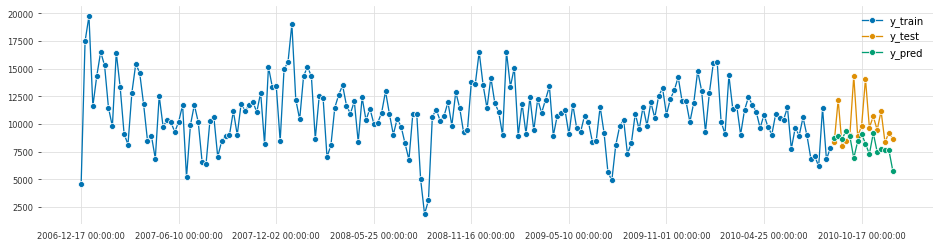

In [ ]:
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
mean_absolute_percentage_error(y_test, y_pred, symmetric=False)

#### N-Hits

In [ ]:
from darts.models import NHiTSModel


In [ ]:
data=FinalizedDataFrame.resample('1W', label='right', closed = 'right', on='DateTime').sum()[['Global_active_power']]
data=data.reset_index()
data['DateTime'] = data['DateTime'].astype(str)
data['DateTime'] = pd.to_datetime(data['DateTime'])
y_train, y_test = temporal_train_test_split(data, test_size=16)

In [ ]:
model = NHiTSModel(
    #model="NBEATSModel",
    #hidden_dim=20,
    dropout=0,
    batch_size=16,
    n_epochs=100,
    optimizer_kwargs={"lr": 1e-3},
    model_name="Air_RNN",
    log_tensorboard=True,
    random_state=42,
   # training_length=20,
    input_chunk_length=int(26),
    output_chunk_length=4,
    force_reset=True,
    #pl_trainer_kwargs={
    #"accelerator": "gpu",
    #"gpus": [0]},
)
model.fit(train, val_series=val)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 846 K 
---------------------------------------------------
833 K     Trainable params
13.3 K    Non-trainable params
846 K     Total params
6.775     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


In [ ]:
y_pred=model.predict(len(y_test))

Predicting: 7it [00:00, ?it/s]

In [ ]:
y_pred=pd.DataFrame(y_pred.values(),columns=['Global_active_power'])
y_pred['DateTime']=y_test['DateTime'].values
y_pred=y_pred.set_index('DateTime')
y_test=y_test.set_index('DateTime')
y_train=y_train.set_index('DateTime')

0.201978978294735

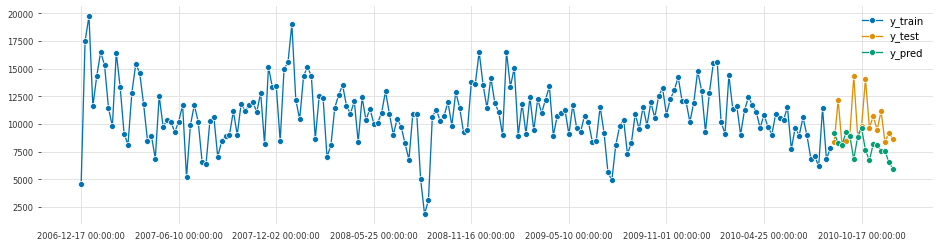

In [ ]:
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
mean_absolute_percentage_error(y_test, y_pred, symmetric=False)

## Model Hyperparameter Optimization Using the OPTUNA framework

In [ ]:
from sktime.forecasting.model_evaluation import evaluate
from sktime.forecasting.model_selection import ExpandingWindowSplitter
import optuna
from sktime.performance_metrics.forecasting import MeanSquaredError
from adtk.visualization import plot
from adtk.detector import SeasonalAD

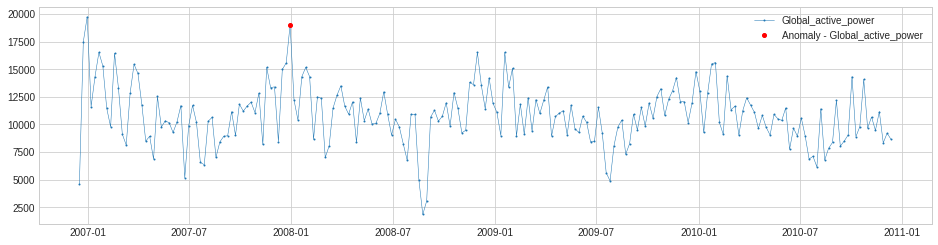

In [ ]:
AggregatedData=FinalizedDataFrame.resample('1W', label='right', closed = 'right', on='DateTime').sum().reset_index()
AnomalyRemovedData=AggregatedData[['DateTime','Global_active_power']].copy().set_index('DateTime')
seasonal_ad = SeasonalAD(freq=53,trend=True,c=2.5)
anomalies = seasonal_ad.fit_detect(AnomalyRemovedData)
#seasonal_ad.score(anomalies)
plot(AnomalyRemovedData, anomaly=anomalies, anomaly_color="red", anomaly_tag="marker")
AnomalyRemovedData['Anomalies']=anomalies['Global_active_power']
AnomalyRemovedData.loc[AnomalyRemovedData['Anomalies']==True,'Global_active_power']=np.nan
AnomalyRemovedData['Global_active_power']=AnomalyRemovedData['Global_active_power'].astype(float).interpolate(method='linear',limit_direction='both')
AnomalyRemovedData=AnomalyRemovedData.drop('Anomalies', axis=1)
for i in range(len(XColumns)):
  AnomalyRemovedData[XColumns[i]]=AggregatedData[XColumns[i]].values
AnomalyRemovedData=AnomalyRemovedData.reset_index().drop('DateTime',axis=1)

In [ ]:
TargetColumn='Global_active_power'
Y=AnomalyRemovedData[TargetColumn]
XColumns=getXcolumnsforY(TargetColumn)
X=AnomalyRemovedData[XColumns]

In [ ]:
loss = MeanSquaredError(square_root=True)
y_trainOpt, y_testOpt,X_trainOpt, X_testOpt = temporal_train_test_split(X=X,y=Y, test_size=53)
fh=ForecastingHorizon([i for i in range(1,len(y_testOpt)+1)])
cv = ExpandingWindowSplitter(initial_window=106, step_length=1,fh=[i for i in range(1,31)])
def XGB_Tuning(trial):

  booster_option1 = trial.suggest_categorical("booster1",  ['gbtree','dart'])
  eval_metric_option1 = trial.suggest_categorical("eval_metric1",  ['rmse','mae','logloss'])
  min_child_weight_option1 = trial.suggest_int("min_child_weight1", 1, 20, step=1)
  #max_delta_step_option1 = trial.suggest_int("max_delta_step1", 0, 300, step=1)

  booster_option2 = trial.suggest_categorical("booster2",  ['gbtree','dart'])
  eval_metric_option2 = trial.suggest_categorical("eval_metric2",  ['rmse','mae','logloss'])
  min_child_weight_option2 = trial.suggest_int("min_child_weight2", 1, 20, step=1)
  #max_delta_step_option2 = trial.suggest_int("max_delta_step2", 0, 300, step=1)
  WindowSize2 = trial.suggest_int("WindowSize2", 30, 40, step=1)

  booster_option3 = trial.suggest_categorical("booster3",  ['gbtree','dart'])
  eval_metric_option3 = trial.suggest_categorical("eval_metric3",  ['rmse','mae','logloss'])
  min_child_weight_option3 = trial.suggest_int("min_child_weight3", 1, 20, step=1)
  #max_delta_step_option3 = trial.suggest_int("max_delta_step3", 0, 300, step=1)
  WindowSize3 = trial.suggest_int("WindowSize3", 10, 30, step=1)

  booster_option4 = trial.suggest_categorical("booster4",  ['gbtree','dart'])
  eval_metric_option4 = trial.suggest_categorical("eval_metric4",  ['rmse','mae','logloss'])
  min_child_weight_option4 = trial.suggest_int("min_child_weight4", 1, 20, step=1)
  #max_delta_step_option4 = trial.suggest_int("max_delta_step4", 0, 300, step=1)
  WindowSize4 = trial.suggest_int("WindowSize4", 3, 10, step=1)

  max_depth_option = trial.suggest_int("max_depth", -1, 50, step=1)
  num_leaves_option = trial.suggest_int("num_leaves", 30, 120, step=5)
  n_estimators_option = trial.suggest_int("n_estimators", 80, 300, step=10)
  learning_rate_option = trial.suggest_float("learning_rate",0.001,0.02,step=0.005)
  metric_option = trial.suggest_categorical("metric",  ['l1','l2','rmse','quantile','mape','huber','fair'])


  forecasters1 = [
      ("SlidingWindow1",  make_reduction(XGBRegressor(booster=booster_option1,
                                                      eval_metric=eval_metric_option1,
                                                      min_child_weight=min_child_weight_option1,
                                                      #max_delta_step=max_delta_step_option1,
                                                      objective='reg:squarederror'), 
                                         window_length=int(53), strategy="recursive")),
      ("SlidingWindow2", make_reduction(XGBRegressor(booster=booster_option2,
                                                     eval_metric=eval_metric_option2,
                                                     min_child_weight=min_child_weight_option2,
                                                     #max_delta_step=max_delta_step_option2,
                                                     objective='reg:squarederror'), 
                                        window_length=WindowSize2#int(26)
                                        , strategy="recursive")),
      ("SlidingWindow3", make_reduction(XGBRegressor(booster=booster_option3,
                                                     eval_metric=eval_metric_option3,
                                                     min_child_weight=min_child_weight_option3,
                                                     #max_delta_step=max_delta_step_option3,
                                                     objective='reg:squarederror'), 
                                        window_length=WindowSize3#int(5)
                                        , strategy="recursive")),
      ("SlidingWindow4", make_reduction(XGBRegressor(booster=booster_option4,
                                                     eval_metric=eval_metric_option4,
                                                     min_child_weight=min_child_weight_option4,
                                                     #max_delta_step=max_delta_step_option4,
                                                     objective='reg:squarederror'), 
                                        window_length=WindowSize4#int(4)
                                        , strategy="recursive")),
  ]
          
  #forecaster = AutoEnsembleForecaster(forecasters=forecasters1,regressor=LGBMRegressor())
  forecaster = AutoEnsembleForecaster(forecasters=forecasters1,regressor=LGBMRegressor(max_depth=max_depth_option,num_leaves=num_leaves_option,n_estimators=n_estimators_option,learning_rate=learning_rate_option,metric=metric_option))

  #Report=evaluate(forecaster=forecaster, y=Y,X=X, cv=cv,strategy='refit',scoring=loss)
  #RMSE=Report['test_MeanSquaredError'].mean()


  # forecaster.fit(y=y_trainOpt,X=X_trainOpt,fh=fh)
  # y_pred = forecaster.predict(X=X_testOpt)
  # plot_series(y_trainOpt, y_testOpt, y_pred, labels=["y_train", "y_test", "y_pred"])


  forecaster.fit(y_train)
  y_pred = forecaster.predict(fh)
  rmse=MeanSquaredError(square_root=True)
  #RMSE=rmse(y_testOpt, y_pred)
  RMSE=rmse(y_test, y_pred)
  #mean_absolute_percentage_error(y_testOpt, y_pred, symmetric=False)
  residuals =y_test- y_pred
  #residuals =y_testOpt- y_pred
  # meanResidual=abs(residuals.mean()[0])
  # stdResidual=residuals.std()[0]
  meanResidual=abs(residuals.mean())
  stdResidual=residuals.std()
  return RMSE,meanResidual,stdResidual



In [ ]:
from optuna.samplers import NSGAIISampler,TPESampler
from optuna.pruners import HyperbandPruner
from optuna.visualization import plot_contour
from optuna.visualization import plot_edf
from optuna.visualization import plot_intermediate_values
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice

In [ ]:

#ptuna.logging.set_verbosity(optuna.logging.WARNING)
optuna.logging.set_verbosity(optuna.logging.ERROR)
#optuna.logging.set_verbosity(optuna.logging.INFO)
study = optuna.create_study(directions=['minimize','minimize','minimize'],sampler=TPESampler()
#,pruner=HyperbandPruner()
)#Target Optimization
study.optimize(lambda trial: XGB_Tuning(trial), n_trials=1000)


/usr/local/lib/python3.7/dist-packages/optuna/samplers/_tpe/parzen_estimator.py:203: RuntimeWarning:

divide by zero encountered in log

/usr/local/lib/python3.7/dist-packages/optuna/samplers/_tpe/parzen_estimator.py:203: RuntimeWarning:

divide by zero encountered in log

/usr/local/lib/python3.7/dist-packages/optuna/samplers/_tpe/parzen_estimator.py:203: RuntimeWarning:

divide by zero encountered in log

/usr/local/lib/python3.7/dist-packages/optuna/samplers/_tpe/parzen_estimator.py:203: RuntimeWarning:

divide by zero encountered in log

/usr/local/lib/python3.7/dist-packages/optuna/samplers/_tpe/parzen_estimator.py:203: RuntimeWarning:

divide by zero encountered in log

/usr/local/lib/python3.7/dist-packages/optuna/samplers/_tpe/parzen_estimator.py:203: RuntimeWarning:

divide by zero encountered in log

/usr/local/lib/python3.7/dist-packages/optuna/samplers/_tpe/parzen_estimator.py:203: RuntimeWarning:

divide by zero encountered in log

/usr/local/lib/python3.7/dist-packages/op

In [ ]:
optuna.visualization.plot_pareto_front(study, target_names=["RMSE", "meanResidual",'stdResidual'])


In [ ]:
trial_with_highest_accuracy = max(study.best_trials, key=lambda t: t.values[1])

In [ ]:
print(f"Trial with highest accuracy: ")
print(f"\tnumber: {trial_with_highest_accuracy.number}")
print(f"\tparams: {trial_with_highest_accuracy.params}")
print(f"\tvalues: {trial_with_highest_accuracy.values}")

Trial with highest accuracy: 
	number: 559
	params: {'booster1': 'dart', 'eval_metric1': 'logloss', 'min_child_weight1': 19, 'booster2': 'dart', 'eval_metric2': 'mae', 'min_child_weight2': 8, 'WindowSize2': 33, 'booster3': 'gbtree', 'eval_metric3': 'mae', 'min_child_weight3': 20, 'WindowSize3': 10, 'booster4': 'gbtree', 'eval_metric4': 'rmse', 'min_child_weight4': 1, 'WindowSize4': 10, 'max_depth': 38, 'num_leaves': 100, 'n_estimators': 260, 'learning_rate': 0.016, 'metric': 'mape'}
	values: [1627.1287278493776, 3.9941907060731197, 1642.694743179205]


In [ ]:
plot_param_importances(study,target=lambda t: t.values[0], target_name=["RMSE", "meanResidual",'stdResidual'])

In [ ]:
optuna.visualization.plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration")

## Final Model

In [ ]:
from sktime.pipeline import make_pipeline
import joblib
from statsmodels.graphics.tsaplots import plot_acf


In [ ]:
joblib.dump(study, "/content/drive/MyDrive/Datasets/TimeSeries/study.pkl")

['/content/drive/MyDrive/Datasets/TimeSeries/study.pkl']

In [ ]:
study=joblib.load("/content/drive/MyDrive/Datasets/TimeSeries/study.pkl")
trial_with_highest_accuracy = max(study.best_trials, key=lambda t: t.values[1])

In [ ]:

Studykeys=list(trial_with_highest_accuracy.params.keys())

In [ ]:
forecasters1 = [
    ("SlidingWindow1",  make_reduction(XGBRegressor(booster=trial_with_highest_accuracy.params[Studykeys[0]],eval_metric=trial_with_highest_accuracy.params[Studykeys[1]],min_child_weight=trial_with_highest_accuracy.params[Studykeys[2]],objective='reg:squarederror'), 
                                        window_length=int(53), strategy="recursive")),
    ("SlidingWindow2", make_reduction(XGBRegressor(booster=trial_with_highest_accuracy.params[Studykeys[3]],eval_metric=trial_with_highest_accuracy.params[Studykeys[4]],min_child_weight=trial_with_highest_accuracy.params[Studykeys[5]],objective='reg:squarederror'), 
                                      window_length=trial_with_highest_accuracy.params[Studykeys[6]]#int(26)
                                      , strategy="recursive")),
    ("SlidingWindow3", make_reduction(XGBRegressor(booster=trial_with_highest_accuracy.params[Studykeys[7]],eval_metric=trial_with_highest_accuracy.params[Studykeys[8]],min_child_weight=trial_with_highest_accuracy.params[Studykeys[9]],objective='reg:squarederror'), 
                                      window_length=trial_with_highest_accuracy.params[Studykeys[10]]#int(5)
                                      , strategy="recursive")),
    ("SlidingWindow4", make_reduction(XGBRegressor(booster=trial_with_highest_accuracy.params[Studykeys[11]],eval_metric=trial_with_highest_accuracy.params[Studykeys[12]],min_child_weight=trial_with_highest_accuracy.params[Studykeys[13]],objective='reg:squarederror'), 
                                      window_length=trial_with_highest_accuracy.params[Studykeys[14]]#int(4)
                                      , strategy="recursive")),
]
        
forecaster = AutoEnsembleForecaster(forecasters=forecasters1,regressor=LGBMRegressor(max_depth=trial_with_highest_accuracy.params[Studykeys[15]],num_leaves=trial_with_highest_accuracy.params[Studykeys[16]],n_estimators=trial_with_highest_accuracy.params[Studykeys[17]],learning_rate=trial_with_highest_accuracy.params[Studykeys[18]],metric=trial_with_highest_accuracy.params[Studykeys[19]]))


In [ ]:
y_trainOpt, y_testOpt,X_trainOpt, X_testOpt = temporal_train_test_split(X=X,y=Y, test_size=53)
fh=ForecastingHorizon([i for i in range(1,len(y_testOpt)+1)])


1627.1287278493776
0.12976892128264944


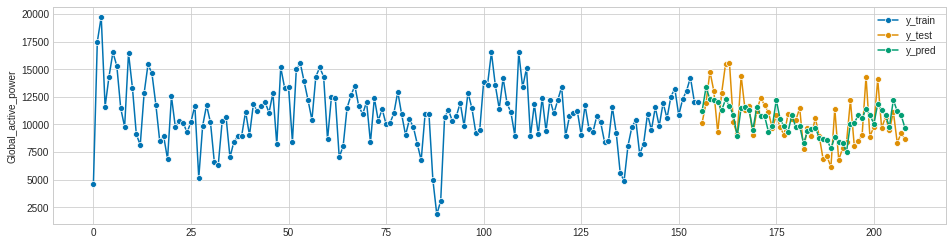

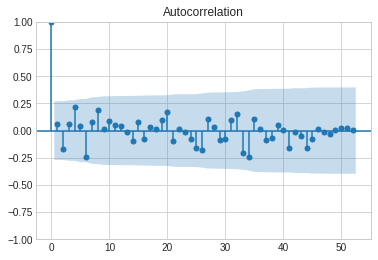

In [ ]:
forecaster=AutoEnsembleForecaster(forecasters=forecasters1,regressor=LGBMRegressor(max_depth=trial_with_highest_accuracy.params[Studykeys[15]],num_leaves=trial_with_highest_accuracy.params[Studykeys[16]],n_estimators=trial_with_highest_accuracy.params[Studykeys[17]],learning_rate=trial_with_highest_accuracy.params[Studykeys[18]],metric=trial_with_highest_accuracy.params[Studykeys[19]]))
forecaster.fit(y=y_trainOpt,X=X_trainOpt,fh=fh)
y_pred = forecaster.predict(X=X_testOpt)
plot_series(y_trainOpt, y_testOpt, y_pred, labels=["y_train", "y_test", "y_pred"])

rmse=MeanSquaredError(square_root=True)
RMSE=rmse(y_testOpt, y_pred)
print(RMSE)
print(mean_absolute_percentage_error(y_testOpt, y_pred, symmetric=False))
residuals = y_testOpt- y_pred
#residuals =y_test- y_pred
fig=plot_acf(residuals, lags=52)

In [ ]:
import flask

In [ ]:
from sktime.forecasting.conformal import ConformalIntervals


In [ ]:
from sklearn.ensemble import RandomForestRegressor

from sktime.datasets import load_airline
from sktime.forecasting.compose import make_reduction
from sktime.forecasting.conformal import ConformalIntervals
from sktime.forecasting.naive import NaiveForecaster

y = load_airline()

f = make_reduction(
    RandomForestRegressor(),
    scitype="tabular-regressor",
    window_length=16,
    strategy="recursive",
)

conformal_forecaster = ConformalIntervals(f,'conformal')
conformal_forecaster.fit(y, fh=[1,2,3])
pred_int = conformal_forecaster.predict_interval()

ValueError: ignored